In [2]:
import warnings
warnings.filterwarnings('ignore') 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F

# Loading the data

In [3]:
Root_dir = "D:/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "D:/New Plant Diseases Dataset(Augmented)/test"
Diseases_classes = os.listdir(train_dir)

# Data Exploration

In [4]:
print("\nTotal number of classes are: ", len(Diseases_classes))


Total number of classes are:  38


## Images in each class, and sample of images

In [5]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)
    
    image_path = os.listdir(train_dir + "/" + i)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)
    
    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    
    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])
    
print("\nTotal Number of Images in Directory: ", tot_images)

The Number of Images in Apple___Apple_scab: 2016 The Number of Images in Apple___Black_rot: 1987 The Number of Images in Apple___Cedar_apple_rust: 1760 The Number of Images in Apple___healthy: 2008 The Number of Images in Blueberry___healthy: 1816 The Number of Images in Cherry_(including_sour)___healthy: 1826 The Number of Images in Cherry_(including_sour)___Powdery_mildew: 1683 The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 The Number of Images in Corn_(maize)___Common_rust_: 1907 The Number of Images in Corn_(maize)___healthy: 1859 The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908 The Number of Images in Grape___Black_rot: 1888 The Number of Images in Grape___Esca_(Black_Measles): 1920 The Number of Images in Grape___healthy: 1692 The Number of Images in Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 The Number of Images in Peach___Bacterial_spot: 1838 The Numbe

## Comparing the number of images in each class

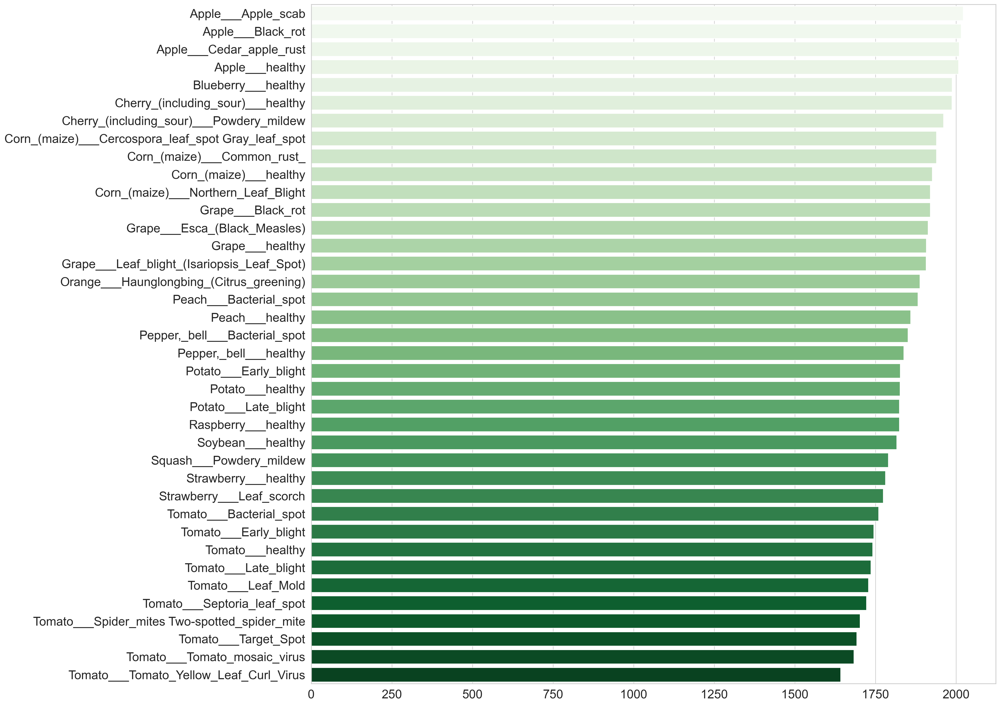

In [6]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

## Pytorch's Image Loader (for training)

In [7]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor()) 

Last Number represents the labels

In [8]:
train
train[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,

In [9]:
train[7000]

(tensor([[[0.7137, 0.6824, 0.6549,  ..., 0.7020, 0.7137, 0.7373],
          [0.6863, 0.5608, 0.5294,  ..., 0.6784, 0.6902, 0.7098],
          [0.4235, 0.4471, 0.6902,  ..., 0.6941, 0.6980, 0.7176],
          ...,
          [0.2667, 0.3137, 0.3137,  ..., 0.2902, 0.3137, 0.3373],
          [0.2314, 0.2667, 0.2353,  ..., 0.3216, 0.3216, 0.3216],
          [0.1765, 0.2314, 0.2275,  ..., 0.3451, 0.3294, 0.3098]],
 
         [[0.6706, 0.6392, 0.6118,  ..., 0.6745, 0.6863, 0.7098],
          [0.6431, 0.5176, 0.4863,  ..., 0.6510, 0.6627, 0.6824],
          [0.3765, 0.4039, 0.6471,  ..., 0.6667, 0.6706, 0.6902],
          ...,
          [0.2588, 0.3059, 0.3059,  ..., 0.3294, 0.3490, 0.3725],
          [0.2235, 0.2588, 0.2275,  ..., 0.3608, 0.3569, 0.3569],
          [0.1686, 0.2235, 0.2196,  ..., 0.3843, 0.3647, 0.3451]],
 
         [[0.7020, 0.6706, 0.6353,  ..., 0.7451, 0.7569, 0.7804],
          [0.6745, 0.5490, 0.5176,  ..., 0.7216, 0.7333, 0.7529],
          [0.4157, 0.4353, 0.6784,  ...,

In [10]:
train[70000]

(tensor([[[0.6471, 0.5020, 0.5529,  ..., 0.5882, 0.5059, 0.5922],
          [0.6667, 0.6706, 0.6471,  ..., 0.5412, 0.6118, 0.5490],
          [0.5294, 0.5098, 0.6196,  ..., 0.6157, 0.5804, 0.7216],
          ...,
          [0.3176, 0.2980, 0.3333,  ..., 0.3490, 0.4196, 0.5020],
          [0.3176, 0.3608, 0.4314,  ..., 0.4431, 0.4275, 0.4039],
          [0.3843, 0.3176, 0.3529,  ..., 0.4549, 0.4118, 0.3686]],
 
         [[0.6235, 0.4784, 0.5294,  ..., 0.5686, 0.4863, 0.5725],
          [0.6431, 0.6471, 0.6235,  ..., 0.5216, 0.5922, 0.5294],
          [0.5059, 0.4863, 0.5961,  ..., 0.5961, 0.5608, 0.7020],
          ...,
          [0.3137, 0.2941, 0.3294,  ..., 0.3529, 0.4235, 0.5059],
          [0.3137, 0.3569, 0.4275,  ..., 0.4471, 0.4314, 0.4078],
          [0.3804, 0.3137, 0.3490,  ..., 0.4588, 0.4157, 0.3725]],
 
         [[0.6392, 0.4941, 0.5451,  ..., 0.5922, 0.5098, 0.5961],
          [0.6588, 0.6627, 0.6392,  ..., 0.5451, 0.6157, 0.5529],
          [0.5216, 0.5020, 0.6118,  ...,

3 (Number of Channels a.k.a. RGB) <br>
256,256 (Size of picture) <br>

In [11]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


Label :Apple___Apple_scab(0)
Label :Apple___Black_rot(1)
Label :Apple___Cedar_apple_rust(2)
Label :Blueberry___healthy(4)
Label :Cherry_(including_sour)___healthy(6)
Label :Corn_(maize)___Common_rust_(8)
Label :Tomato___Septoria_leaf_spot(32)
Label :Tomato___healthy(37)


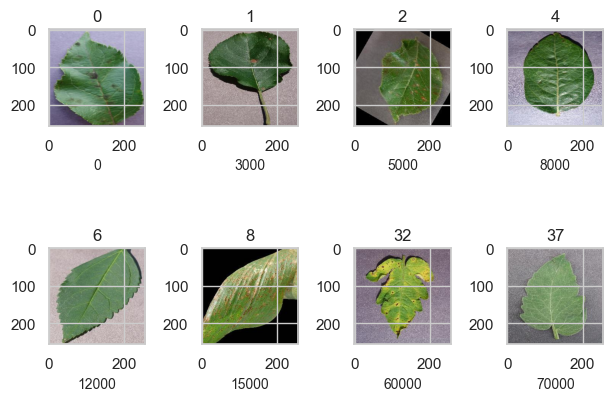

In [12]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]
    
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

# Loading Data for training

In [13]:
# DataLoaders for training and validation
batch_size = 32

train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

# Moving training to GPU

In [14]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

device = get_default_device()
device

train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

# Setting up the model

## Classification Base

Let's create a step by step classification base module:

First, Training_step: the images and labels take values from batch. The output of model is a type of images and the loss is calculate from F cross entropy function (out, labels). It seems that the prediction is compared with the actual values in labels.

Second, validation step: is just like the above one. But it has another attribute call acc.

Third, validation_epoch_end: calculate the losses and acces of each batchs and epochs.

Fourth, epoch_end: That shows the final results of everything.

In [15]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [16]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

## Convolution Block

- Number of inputs
- Outputs
- Kernel Size
- Padding
- Batch Normalisation (WHY?)
- Max Pooling (Blah Blah)

In [17]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

## CNN
We use the class of ImageClassificationBase for taking methods like calculating the loss and acc of epochs. And after that, we set our layers. We use more layers but in this case, the size of images don't allow to do that Going to be zero. In the second part, we connect layers to each other. The output of layer number N, is the input of layer number N+1.

In [18]:
# resnet architecture 
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) 
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)
        
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out        

## Model

Connecting the model to use a GPU

In [19]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device) 
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

## Model Eval / Optimisation

In [20]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [21]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

## Model Training

In [22]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy. 
    #The 1cycle policy anneals the learning rate from an initial learning rate to some 
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate. 
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation
        
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history

In [23]:
history = [evaluate(model, valid_dataloader)]
history

num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=optims)

Epoch [0], train_loss: 0.7002, val_loss: 0.7563, val_acc: 0.7870
Epoch [1], train_loss: 0.3336, val_loss: 1.3605, val_acc: 0.6693
Epoch [2], train_loss: 0.2297, val_loss: 0.2534, val_acc: 0.9182
Epoch [3], train_loss: 0.1033, val_loss: 0.0505, val_acc: 0.9844
Epoch [4], train_loss: 0.0241, val_loss: 0.0216, val_acc: 0.9935


In [25]:
# Print model's state_dict
print("Model's state_dict:")
for param_tensor in model.state_dict():
    print(param_tensor, "\t", model.state_dict()[param_tensor].size())

Model's state_dict:
conv1.0.weight 	 torch.Size([64, 3, 3, 3])
conv1.0.bias 	 torch.Size([64])
conv1.1.weight 	 torch.Size([64])
conv1.1.bias 	 torch.Size([64])
conv1.1.running_mean 	 torch.Size([64])
conv1.1.running_var 	 torch.Size([64])
conv1.1.num_batches_tracked 	 torch.Size([])
conv2.0.weight 	 torch.Size([128, 64, 3, 3])
conv2.0.bias 	 torch.Size([128])
conv2.1.weight 	 torch.Size([128])
conv2.1.bias 	 torch.Size([128])
conv2.1.running_mean 	 torch.Size([128])
conv2.1.running_var 	 torch.Size([128])
conv2.1.num_batches_tracked 	 torch.Size([])
res1.0.0.weight 	 torch.Size([128, 128, 3, 3])
res1.0.0.bias 	 torch.Size([128])
res1.0.1.weight 	 torch.Size([128])
res1.0.1.bias 	 torch.Size([128])
res1.0.1.running_mean 	 torch.Size([128])
res1.0.1.running_var 	 torch.Size([128])
res1.0.1.num_batches_tracked 	 torch.Size([])
res1.1.0.weight 	 torch.Size([128, 128, 3, 3])
res1.1.0.bias 	 torch.Size([128])
res1.1.1.weight 	 torch.Size([128])
res1.1.1.bias 	 torch.Size([128])
res1.1.1.run

In [28]:
torch.save(model.state_dict(), "data\model.pth")

# Results

In [ ]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

## Test Data

In [ ]:
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(test_images)
print(len(test_images))

In [ ]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

In [ ]:
correct = 0
wrong = 0
for i in range(test_images):
    print(len(test_images))